In [1]:
import os
iskaggle = os.environ.get('KAGGLE_KERNEL_RUN_TYPE', '')

if iskaggle:
    !pip install -Uqq fastai

In [2]:
!pip install -Uqq duckduckgo_search

## Test single images

In [3]:
from duckduckgo_search import ddg_images
from fastcore.all import *
from fastdownload import download_url
from fastai.vision.all import *

def search_images(term, max_images=200): 
    return L(ddg_images(term, max_results=max_images)).itemgot('image')

/opt/conda/lib/python3.10/site-packages/duckduckgo_search/compat.py:40: UserWarning: ddg_images is deprecated. Use DDGS().images() generator
  warnings.warn("ddg_images is deprecated. Use DDGS().images() generator")


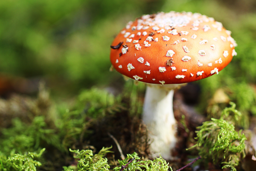

In [4]:
urls = search_images('mushroom photos', max_images=1)
dest = 'mushroom.jpg'
download_url(urls[0], dest, show_progress=False)
im = Image.open(dest)
im.to_thumb(256,256)

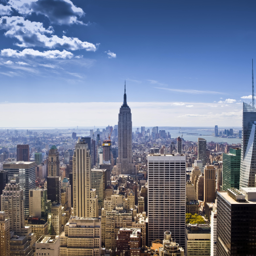

In [5]:
nyc_urls = search_images('new york photos', max_images=1)
download_url(nyc_urls[0], 'nyc.jpg', show_progress=False)
Image.open('nyc.jpg').to_thumb(256,256)

## Batch download

In [6]:
searches = "mushroom","new york"
path = Path('mushroom_or_not')
from time import sleep

for item in searches:
    dest = (path/item)
    dest.mkdir(exist_ok=True, parents=True)
    download_images(dest, urls=search_images(f'{item} photo'))
    sleep(10)  # Pause between searches to avoid over-loading server
    download_images(dest, urls=search_images(f'{item} sun photo'))
    sleep(10)
    download_images(dest, urls=search_images(f'{item} shade photo'))
    sleep(10)
    resize_images(path/item, max_size=400, dest=path/item) # 400 here splits into 200 for each item

## Train the model

In [7]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

28

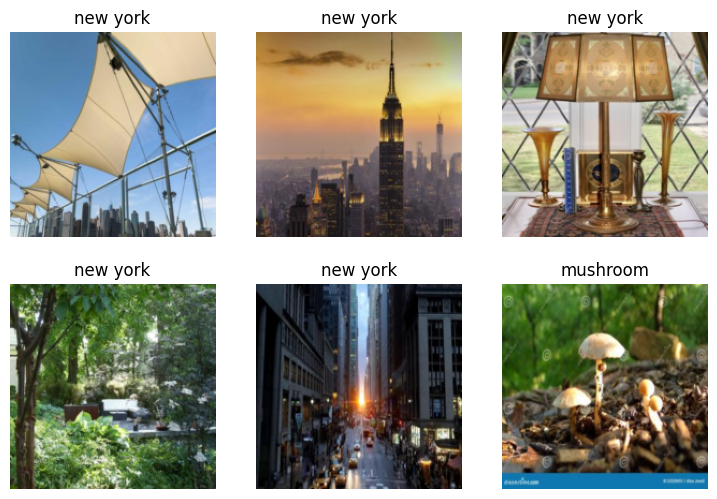

In [8]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock), # inputs to our model are images, and the outputs are categories
    get_items=get_image_files, # find all the inputs to our model, which returns a list of all image files in a path
    splitter=RandomSplitter(valid_pct=0.2, seed=42), # Split the data into training and validation sets randomly, using 20% of the data for the validation set.
    get_y=parent_label, # the labels will be the parent of each file, in this case the folder they are in, new york, or mushroom
    item_tfms=[Resize(192, method='squish')] #resize each image to 192x192 pixels by "squishing" it
).dataloaders(path)

dls.show_batch(max_n=6)

In [9]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(3)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 177MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,0.776240,0.174636,0.083333,00:28


epoch,train_loss,valid_loss,error_rate,time
0,0.240922,0.133792,0.052083,00:40
1,0.136584,0.139916,0.052083,00:40
2,0.096241,0.138257,0.041667,00:40


## Prediction

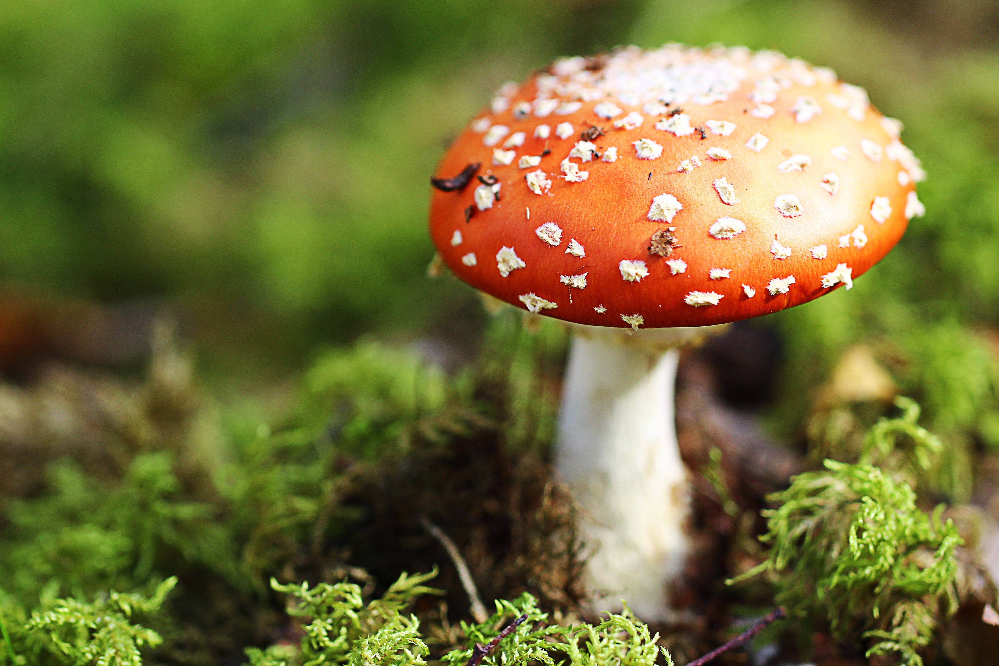

In [10]:
mushroom = PILImage.create('mushroom.jpg')
mushroom 

In [11]:
is_mushroom,_,probs = learn.predict(mushroom)
print(f"This is a: {is_mushroom}.")
print(f"Probability it's a mushroom: {probs[0]:.4f}")

This is a: mushroom.
Probability it's a mushroom: 0.9992
